In [ ]:
#hide
%reload_ext autoreload
%autoreload 2

In [ ]:
from peptdeep.rescore.percolator import Percolator
import os

In [ ]:
#hide
from alphabase.io.psm_reader import psm_reader_provider
reader = psm_reader_provider.get_reader('alphapept', fdr=1, keep_decoy=True)
reader.import_file(os.path.expanduser('~/Workspace/Data/HeLa_500ng/HeLa_500ng.ms_data.hdf'))
select_col = 'spec_idx' #scan no
idx = reader.psm_df.groupby(select_col)['score'].idxmax()
psm_df = reader.psm_df.loc[idx]
psm_df.drop_duplicates([select_col,'sequence','mods'],inplace=True)
psm_df.sort_values(select_col)

,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,decoy,nAA,rt_norm
74308,10.075488,3136,116023,30.743690,370.848036,3,HeLa_500ng,HFHETTPNK,,,0,9,0.084076
4813,10.064221,3137,46345,23.759086,387.678872,2,HeLa_500ng,HDYPSR,,,0,6,0.083982
124032,10.063720,3138,177283,26.872250,480.579816,3,HeLa_500ng,LFIHNHEQHHK,,,0,11,0.083978
22537,10.075908,3139,68990,23.491045,448.713123,2,HeLa_500ng,KVEDMMK,Oxidation@M,6,0,7,0.084079
67005,10.087931,3141,107020,27.624159,356.511542,3,HeLa_500ng,INHEGEVNR,,,0,9,0.084180
...,...,...,...,...,...,...,...,...,...,...,...,...,...
268822,108.174250,128500,239773,18.439210,1080.046971,2,HeLa_500ng,SEVRHQWLSETSVLGQMR,Oxidation@M,17,1,18,0.902670
222484,108.616336,128925,213187,27.497105,872.413137,2,HeLa_500ng,AMGIMNSFVNDIFER,,,0,15,0.906359
202586,119.684648,133371,215017,28.136146,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,0,14,0.998720
202588,119.684648,133374,215019,18.902502,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,0,14,0.998720


In [ ]:
#hide
perc = Percolator()
perc_df = perc.extract_features(psm_df, 
    ms2_file_type='alphapept', 
    ms2_file_dict={
        'HeLa_500ng':
        os.path.expanduser('~/Workspace/Data/HeLa_500ng/HeLa_500ng.ms_data.hdf')
    }
)
perc_df

2022-01-21 17:26:22> Fine-tuning models ...
2022-01-21 17:26:22> Preparing for fine-tuning ...


100%|██████████| 1/1 [00:45<00:00, 45.00s/it]

2022-01-21 17:27:08> Fine-tuning ...


2022-01-21 17:36:14> Extracting peptdeep features with multiprocessing ...


100%|██████████| 1/1 [04:58<00:00, 298.07s/it]

2022-01-21 17:41:12> Finished feature extraction with multiprocessing


,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,...,spc,frag_ratio,cos_bion,sa_bion,spc_bion,frag_ratio_bion,cos_yion,sa_yion,spc_yion,frag_ratio_yion
0,48.083985,52984,39192,20.222333,368.169493,2,HeLa_500ng,MMHFK,Acetyl@Protein N-term,0,...,0.976471,1.000000,0.958190,0.815260,1.000000,0.750000,0.954875,0.808022,0.880952,1.000000
1,48.083985,52879,39191,19.578986,368.169493,2,HeLa_500ng,MMHFK,Acetyl@Protein N-term,0,...,0.832353,1.000000,0.905710,0.721323,0.404762,0.750000,0.967665,0.837665,0.880952,1.000000
2,34.917818,35772,27439,21.542081,335.191208,2,HeLa_500ng,MHVIK,Acetyl@Protein N-term,0,...,0.919118,1.000000,0.993747,0.928770,0.809524,1.000000,0.941771,0.781679,0.976190,1.000000
3,29.086584,28372,21380,21.033489,631.286111,1,HeLa_500ng,MDAPR,Acetyl@Protein N-term,0,...,0.973529,1.000000,0.798619,0.588871,0.976190,0.750000,0.821269,0.613467,0.976190,1.000000
4,69.418941,80295,26864,20.282766,665.343669,1,HeLa_500ng,MFVAR,Acetyl@Protein N-term,0,...,0.864706,1.000000,0.983247,0.883307,0.809524,0.750000,0.985946,0.893141,0.928571,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89177,94.657040,111756,258196,26.228077,637.732925,5,HeLa_500ng,TFNQVEIKPEMIGHYLGEFSITYKPVK,Oxidation@M,11,...,0.451003,0.500000,0.780746,0.570321,0.405148,0.153846,0.918445,0.741110,0.524289,0.346154
89178,90.452143,106646,257002,34.391748,752.869056,4,HeLa_500ng,SCDEPLTPPPHSPTSMLQLIHDPVSPR,Carbamidomethyl@C,2,...,0.864366,0.730769,0.973071,0.851924,0.905618,0.192308,0.962785,0.825775,0.864851,0.615385
89179,79.127174,92443,257030,21.259003,1004.517591,3,HeLa_500ng,AAVLRTAMDALTFQLYQNSALPEGFQR,,,...,-0.162840,0.269231,0.012792,0.008144,-0.340220,0.153846,0.129093,0.082413,0.064373,0.192308
89180,96.908558,114599,256784,17.466505,995.554266,3,HeLa_500ng,TAFKFGVEVGFTLCLAVLLLNKSLSEK,Carbamidomethyl@C,14,...,-0.429297,0.192308,0.536466,0.360482,-0.150474,0.153846,0.175850,0.112535,-0.593785,0.038462


In [ ]:
#hide
df = perc_df.copy()
perc.cv_fold = 2
df = perc.re_score(df)
df

2022-01-21 17:41:13> 62889 target PSMs at 0.01 psm-level FDR
2022-01-21 17:41:13> [PERC] Iteration 1 of Percolator ...
2022-01-21 17:41:13> [PERC] 69702 target PSMs at 0.01 psm-level FDR
2022-01-21 17:41:13> [PERC] Iteration 2 of Percolator ...
2022-01-21 17:41:14> [PERC] 71628 target PSMs at 0.01 psm-level FDR
2022-01-21 17:41:14> [PERC] Iteration 3 of Percolator ...
2022-01-21 17:41:14> [PERC] 71973 target PSMs at 0.01 psm-level FDR
2022-01-21 17:41:14> [PERC] Iteration 4 of Percolator ...
2022-01-21 17:41:15> [PERC] 71976 target PSMs at 0.01 psm-level FDR
2022-01-21 17:41:15> [PERC] Iteration 5 of Percolator ...
2022-01-21 17:41:16> [PERC] 71986 target PSMs at 0.01 psm-level FDR
2022-01-21 17:41:16> 71986 target PSMs at 0.01 psm-level FDR


,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,...,spc,frag_ratio,cos_bion,sa_bion,spc_bion,frag_ratio_bion,cos_yion,sa_yion,spc_yion,frag_ratio_yion
0,44.586162,48444,251150,98.768397,1275.576245,2,HeLa_500ng,SPSEESAPTTSPESVSGSVPSSGSSGR,,,...,0.869850,0.961538,0.991818,0.918509,0.823572,0.615385,0.997115,0.951632,0.911167,0.884615
1,104.552893,123893,251604,94.192667,1288.160039,2,HeLa_500ng,TFSHELSDFGLESTAGEIPVVAIR,,,...,0.857151,1.000000,0.994091,0.930761,0.707308,0.739130,0.999084,0.972756,0.967006,1.000000
2,91.803306,108222,254578,99.996311,1378.691632,2,HeLa_500ng,IEPELDGSAQVTSHDASTNGLINFIK,,,...,0.773765,1.000000,0.758395,0.548033,0.663433,0.960000,0.979511,0.870907,0.863001,0.920000
3,43.152296,46601,250148,95.488343,1254.089483,2,HeLa_500ng,VGEVCHITCKPEYAYGSAGSPPK,Carbamidomethyl@C;Carbamidomethyl@C,5;9,...,0.598279,1.000000,0.936452,0.771823,0.465751,0.954545,0.994342,0.932247,0.723467,1.000000
4,56.433641,63712,254324,95.149144,1372.160484,2,HeLa_500ng,TNHIGHTGYLNTVTVSPDGSLCASGGK,Carbamidomethyl@C,22,...,0.717092,0.961538,0.980013,0.872506,0.793050,0.692308,0.991256,0.915749,0.656450,0.923077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89177,100.968274,119669,176118,19.108783,716.375607,2,HeLa_500ng,LGSSREHQSFRK,,,...,-0.277801,0.636364,0.017411,0.011084,-0.612648,0.454545,0.054209,0.034528,0.165443,0.181818
89178,92.835367,109494,148900,18.986595,637.835750,2,HeLa_500ng,TPSQCRERIK,Carbamidomethyl@C,5,...,-0.407979,0.777778,0.075594,0.048170,-0.595459,0.555556,0.022186,0.014125,0.001032,0.222222
89179,95.174626,112475,67386,18.967470,887.442029,1,HeLa_500ng,LPGGVECR,Carbamidomethyl@C,7,...,-0.273946,0.857143,0.250832,0.161409,0.797802,0.714286,0.082692,0.052704,-0.593407,0.142857
89180,40.075474,42857,136778,19.436366,606.308712,2,HeLa_500ng,ERVFDRFDK,,,...,-0.659274,0.750000,0.079877,0.050906,-0.427941,0.625000,0.140240,0.089575,-0.535294,0.125000


In [ ]:
df.sort_values('spec_idx')

,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,...,spc,frag_ratio,cos_bion,sa_bion,spc_bion,frag_ratio_bion,cos_yion,sa_yion,spc_yion,frag_ratio_yion
37248,10.075488,3136,116023,30.743690,370.848036,3,HeLa_500ng,HFHETTPNK,,,...,0.992302,1.000000,0.970367,0.844633,0.979412,0.750000,0.968758,0.840448,0.997059,0.750000
51682,10.064221,3137,46345,23.759086,387.678872,2,HeLa_500ng,HDYPSR,,,...,1.000000,1.000000,0.999617,0.982375,1.000000,0.600000,0.998981,0.971257,1.000000,1.000000
36985,10.063720,3138,177283,26.872250,480.579816,3,HeLa_500ng,LFIHNHEQHHK,,,...,0.930957,1.000000,1.000000,1.000000,1.000000,0.100000,0.985079,0.889889,0.946617,1.000000
58177,10.075908,3139,68990,23.491045,448.713123,2,HeLa_500ng,KVEDMMK,Oxidation@M,6,...,0.665217,1.000000,0.998321,0.963102,0.195804,0.333333,0.985582,0.891764,0.986014,1.000000
37598,10.087931,3141,107020,27.624159,356.511542,3,HeLa_500ng,INHEGEVNR,,,...,0.789773,1.000000,0.792031,0.581952,0.742647,0.500000,0.995693,0.940893,0.867647,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87802,108.174250,128500,239773,18.439210,1080.046971,2,HeLa_500ng,SEVRHQWLSETSVLGQMR,Oxidation@M,17,...,-0.006375,0.294118,0.418360,0.274790,-0.085867,0.176471,0.180315,0.115424,0.107257,0.176471
44692,108.616336,128925,213187,27.497105,872.413137,2,HeLa_500ng,AMGIMNSFVNDIFER,,,...,0.665208,0.857143,0.985195,0.890317,0.539956,0.285714,0.991318,0.916049,0.788725,0.714286
40323,119.684648,133371,215017,28.136146,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,...,0.813882,0.769231,0.999672,0.983698,0.819145,0.153846,0.975699,0.859366,0.851966,0.769231
76195,119.684648,133374,215019,18.902502,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,...,0.464100,0.615385,0.997284,0.953073,0.819145,0.153846,0.724863,0.516194,0.266667,0.461538


In [ ]:
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
init_notebook_mode()
def plot_score_dist(df, x='ml_score'):
    fig = go.Figure()
    for decoy, df_group in df.groupby('decoy'):
        fig.add_histogram(x=df_group[x], name='decoy' if decoy else 'target')
    return fig

In [ ]:
plot_score_dist(df, 'score')

In [ ]:
plot_score_dist(df, 'ml_score')

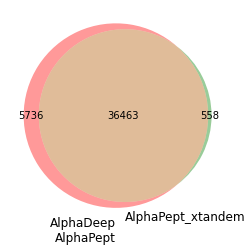

In [ ]:
from matplotlib_venn import venn2
from peptdeep.rescore.fdr import calc_fdr_for_df
df_fdr = df[(df.fdr<0.01)&(df.decoy==0)]
ap_df = calc_fdr_for_df(df, 'score')
ap_df = ap_df[(ap_df.fdr<0.01)&(ap_df.decoy==0)]
venn2(
    [set(df_fdr.sequence.values), set(ap_df.sequence.values)],
    ['peptdeep\nAlphaPept','AlphaPept_xtandem']
)